## Green Space and Air Quality

### Green Space Percent Area in Best and Worst Counties 2020
Green space data is queried from OSM and (I think) it's current, we query green space for the 2020 Best and Worst air quality counties, based on the number of "Total Unhealthy Days" per year per county.

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import folium
import osmnx as ox
import matplotlib.pyplot as plt

### Map Data

#### Get California County Boundary Data and Map

In [2]:
# PRODUCE and SAVE CALIFORNIA COUNTY BOUNDARY MAP

# Load U.S. county boundaries dataset from github repository plotly/datasets with FIPS codes as identifier

#url = "https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json"
#us_counties = gpd.read_file(url)

# Filter for California counties
#CA_county_bndries = us_counties[us_counties['STATE'] == '06']  # '06' is California's FIPS code

# Save California counties to a new GeoJSON file
#CA_county_bndries.to_file("CA_county_bndries.geojson", driver="GeoJSON")

#CA_county_bndries.head()

In [3]:
#Since I saved the CA boundaries data into a GeoJSON, I can simply upload and skip running the cell above
CA_county_bndries = gpd.read_file("CA_county_bndries.geojson")
CA_county_bndries.head()

,id,GEO_ID,STATE,COUNTY,NAME,LSAD,CENSUSAREA,geometry
0,06005,0500000US06005,06,005,Amador,County,594.583,"POLYGON ((-120.9955 38.2254, -121.02708 38.300..."
1,06021,0500000US06021,06,021,Glenn,County,1313.947,"POLYGON ((-122.93765 39.79816, -122.04647 39.7..."
2,06033,0500000US06033,06,033,Lake,County,1256.464,"POLYGON ((-122.6274 38.66751, -122.82159 38.85..."
3,06043,0500000US06043,06,043,Mariposa,County,1448.816,"POLYGON ((-120.38767 37.63336, -120.38733 37.6..."
4,06055,0500000US06055,06,055,Napa,County,748.362,"POLYGON ((-122.10328 38.51335, -122.08884 38.3..."


In [4]:
#Check CRS
print(CA_county_bndries.crs)

EPSG:4326


In [5]:
#print(CA_county_bndries.__geo_interface__.keys())

In [6]:
#print(CA_county_bndries.__geo_interface__)

In [7]:
# Map CA county boundaries

from folium import GeoJson

# Set CRS
#CA_county_bndries = CA_county_bndries.to_crs(epsg=4326)

# Initialize a Folium map centered on California
CA_county_map = folium.Map(location=[37.5, -119.5], zoom_start=6)


# Styling for the county boundaries
style_function = lambda x: {
    "fillColor": "none",  # Transparent fill
    "color": "#ff7f50",  # Coral for the outline
    "weight": 2,  # Outline thickness
    "fillOpacity": 0.1  # Transparent fill
}

# Add county boundaries to the map with tooltips and the updated style
county_geojson = folium.GeoJson(
    CA_county_bndries,
    #CA_county_bndries.to_json(),  # Convert GeoDataFrame to GeoJSON
    name="CA County Boundaries",
    style_function=style_function,
)

county_geojson.add_to(CA_county_map)

# Add layer control to toggle between layers
folium.LayerControl().add_to(CA_county_map)

#CA_county_map.save("CA_county_map.html")

# Display the map
CA_county_map

### Map Green Space Data of Best and Worst Air Quality Counties of 2020
Worst 2020 - San Bernardino, Riverside, Los Angeles, Tulare, Kern   
Best 2020 - Lake, Humboldt, Shasta, Sonoma, Tuolumne

In [8]:
# Set the region for extraction
place_names_worst_counties_2020 = ['San Bernardino, California, USA', 'Riverside, California, USA', 'Los Angeles, California, USA', 'Tulare, California, USA', 'Kern, California, USA']
place_names_best_counties_2020 = ['Lake, California, USA', 'Humboldt, California, USA', 'Shasta, California, USA', 'Sonoma, California, USA', 'Tuolumne, California, USA']


In [9]:
#QUERY GREEN SPACE DATA 

# Set the region for extraction (e.g., California)
#place_names_worst_counties_2020 = ['San Bernardino, California, USA', 'Riverside, California, USA', 'Los Angeles, California, USA', 'Tulare, California, USA', 'Kern, California, USA']
#place_names_best_counties_2020 = ['Lake, California, USA', 'Humboldt, California, USA', 'Shasta, California, USA', 'Sonoma, California, USA', 'Tuolumne, California, USA']


# Query for green space data (parks, recreational areas, etc.)
#green_spaces_worst_counties_2020 = ox.features_from_place(place_names_worst_counties_2020, tags={'leisure': ['park', 'nature_reserve', 'garden'],
#                                                         'landuse': ['forest', 'grass'],
#                                                         'boundary': ['national_park', 'protected_area']})


#green_spaces_best_counties_2020 = ox.features_from_place(place_names_best_counties_2020, tags={'leisure': ['park', 'nature_reserve', 'garden'],
#                                                         'landuse': ['forest', 'grass'],
#                                                         'boundary': ['national_park', 'protected_area']})

# NOTE: ox.features_from_place() returns a geopandas df which includes geometries (points,lines,polygons) and attribute data from OMS




In [10]:
# Export to GeoJSON (Recommended for mapping)
#green_spaces_worst_counties_2020.to_file("green_spaces_worst_counties_2020.geojson", driver="GeoJSON")
#green_spaces_best_counties_2020.to_file("green_spaces_best_counties_2020.geojson", driver="GeoJSON")

In [11]:
#Load GeoJSON OSM data (exported in the cell above)
#green_spaces_worst_counties_2020 = gpd.read_file("green_spaces_worst_counties_2020.geojson")
#green_spaces_best_counties_2020 = gpd.read_file("green_spaces_best_counties_2020.geojson")

In [12]:
# Query additional tags using OSMnx
# additional_tags = {
    # 'leisure': ['golf_course', 'bird_hide', 'dog_park', 'pitch', 'recreation_ground'],
    # 'landuse': ['meadow', 'vineyard', 'flowerbed', 'recreation_ground', 'village_green', 'greenery', 'allotment'],
    # 'natural': ['fell', 'grassland', 'shrubbery', 'tundra', 'wood', 'heath', 'scrub'],
    # 'place': ['square', 'village_green']
# }

# Query the new data
# new_data_worst_counties = ox.features_from_place(place_names_worst_counties_2020, tags=additional_tags)

# new_data_best_counties = ox.features_from_place(place_names_best_counties_2020, tags=additional_tags)


#Check coordinate reference system

# print(new_data_worst_counties.crs)
# print(new_data_best_counties.crs)

# Ensure CRS matches your existing data
#new_data = new_data.to_crs(green_spaces_worst_counties_2020.crs)

# Combine the two datasets
# green_spaces_worst_counties_2020 = gpd.GeoDataFrame(pd.concat([green_spaces_worst_counties_2020, new_data_worst_counties], ignore_index=True))
# green_spaces_best_counties_2020 = gpd.GeoDataFrame(pd.concat([green_spaces_best_counties_2020, new_data_best_counties], ignore_index=True))

# Optionally drop duplicates (if geometries overlap)
# green_spaces_worst_counties_2020 = green_spaces_worst_counties_2020.drop_duplicates(subset='geometry')
# green_spaces_best_counties_2020 = green_spaces_best_counties_2020.drop_duplicates(subset='geometry')


# Save the updated data

# green_spaces_worst_counties_2020.to_file("updated_green_spaces_worst_counties_2020.geojson", driver="GeoJSON")
# green_spaces_best_counties_2020.to_file("updated_green_spaces_best_counties_2020.geojson", driver="GeoJSON")

In [13]:
#Load GeoJSON OSM data (exported in the cell above)
green_spaces_worst_counties_2020 = gpd.read_file("updated_green_spaces_worst_counties_2020.geojson")
green_spaces_best_counties_2020 = gpd.read_file("updated_green_spaces_best_counties_2020.geojson")

In [14]:
#Check Type (Should be geopandas dataframe)
print(type(green_spaces_worst_counties_2020))
print(type(green_spaces_best_counties_2020))
print(type(CA_county_bndries))

<class 'geopandas.geodataframe.GeoDataFrame'>
<class 'geopandas.geodataframe.GeoDataFrame'>
<class 'geopandas.geodataframe.GeoDataFrame'>


In [15]:
green_spaces_worst_counties_2020.columns.to_list()

['element',
 'id',
 'ele',
 'gnis:feature_id',
 'leisure',
 'name',
 'wikidata',
 'fixme',
 'website',
 'addr:city',
 'addr:housenumber',
 'addr:postcode',
 'addr:state',
 'addr:street',
 'garden:type',
 'operator',
 'operator:type',
 'wheelchair',
 'landuse',
 'amenity',
 'check_date',
 'note',
 'fee',
 'access',
 'opening_hours',
 'url',
 'source',
 'description',
 'phone',
 'email',
 'boundary',
 'protect_class',
 'protection_title',
 'dog',
 'alcohol',
 'owner',
 'source_ref',
 'garden:style',
 'alt_name',
 'image',
 'historic',
 'proposed',
 'golf',
 'brand',
 'brand:wikidata',
 'shop',
 'operator:wikidata',
 'created_by',
 'tourism',
 'protected_area',
 'payment:cash',
 'building',
 'name:es',
 'wikipedia',
 'elevation',
 'area',
 'internet_access',
 'designation',
 'name:etymology:wikidata',
 'height',
 'lacounty:ain',
 'lacounty:bld_id',
 'attribution',
 'csp:globalid',
 'csp:unitcode',
 'type',
 'park:type',
 'barrier',
 'sport',
 'smoking',
 'natural',
 'wetland',
 'source:el

In [16]:
#Turn into geoDataFrames if they ar not already
#green_spaces_worst_counties_2020 = gpd.GeoDataFrame(green_spaces_worst_counties_2020)
#CA_county_bndries = gpd.GeoDataFrame(CA_county_bndries)

In [17]:
#Check coordinate reference system
print(green_spaces_worst_counties_2020.crs)
print(green_spaces_best_counties_2020.crs)
print(CA_county_bndries.crs)

EPSG:4326
EPSG:4326
EPSG:4326


In [18]:
# Reproject to the same CRS if necessary
#if green_spaces_worst_counties_2020.crs != CA_county_bndries.crs:
#    green_spaces_worst_counties_2020 = green_spaces_worst_counties_2020.to_crs(CA_county_bndries.crs)

In [19]:
#Get Geometry TYPES
print(green_spaces_worst_counties_2020.geom_type.value_counts())
print(green_spaces_best_counties_2020.geom_type.value_counts())
print(CA_county_bndries.geom_type.value_counts())

Polygon         26377
Point             330
MultiPolygon      249
LineString        174
Name: count, dtype: int64
Polygon         11073
Point             183
MultiPolygon       76
LineString         45
Name: count, dtype: int64
Polygon         54
MultiPolygon     4
Name: count, dtype: int64


In [20]:
#Convert POLYGON types to MULTIPOLYGON types for the three above gdfs
from shapely.geometry import MultiPolygon

# Ensure all geometries in green_spaces are MultiPolygon
green_spaces_worst_counties_2020['geometry'] = green_spaces_worst_counties_2020['geometry'].apply(
    lambda geom: MultiPolygon([geom]) if geom.geom_type == 'Polygon' else geom
)

green_spaces_best_counties_2020['geometry'] = green_spaces_best_counties_2020['geometry'].apply(
    lambda geom: MultiPolygon([geom]) if geom.geom_type == 'Polygon' else geom
)

# Ensure all geometries in ca_counties are MultiPolygon
CA_county_bndries['geometry'] = CA_county_bndries['geometry'].apply(
    lambda geom: MultiPolygon([geom]) if geom.geom_type == 'Polygon' else geom
)

print(green_spaces_worst_counties_2020.geom_type.value_counts())
print(green_spaces_best_counties_2020.geom_type.value_counts())
print(CA_county_bndries.geom_type.value_counts())

MultiPolygon    26626
Point             330
LineString        174
Name: count, dtype: int64
MultiPolygon    11149
Point             183
LineString         45
Name: count, dtype: int64
MultiPolygon    58
Name: count, dtype: int64


In [21]:
# FILTER for MULTIPOLYGONS 

# Ensure green_spaces gdf contains only MultiPolygons
green_spaces_worst_counties_2020_multipoly = green_spaces_worst_counties_2020[green_spaces_worst_counties_2020.geom_type == "MultiPolygon"]
green_spaces_best_counties_2020_multipoly = green_spaces_best_counties_2020[green_spaces_best_counties_2020.geom_type == "MultiPolygon"]

# CA_county_bndries gdf contains only MultiPolygons, otherwise we would ensure so by:
#CA_county_bndries_multipoly = CA_county_bndries[CA_county_bndries.geom_type == "MultiPolygon"]

In [22]:
print(green_spaces_worst_counties_2020_multipoly.geom_type.value_counts())
print(green_spaces_best_counties_2020_multipoly.geom_type.value_counts())
print(CA_county_bndries.geom_type.value_counts())

MultiPolygon    26626
Name: count, dtype: int64
MultiPolygon    11149
Name: count, dtype: int64
MultiPolygon    58
Name: count, dtype: int64


In [23]:
#Check coordinate reference system
print(green_spaces_worst_counties_2020_multipoly.crs)
print(green_spaces_best_counties_2020_multipoly.crs)
print(CA_county_bndries.crs)

EPSG:4326
EPSG:4326
EPSG:4326


In [24]:
# Change datetime columns to str for mapping
green_spaces_worst_counties_2020_multipoly.dtypes.to_list()

[dtype('O'),
 dtype('float64'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype

In [25]:
datetime_cols = green_spaces_worst_counties_2020_multipoly.select_dtypes('datetime').columns
print(datetime_cols)

Index(['nrhp:inscription_date', 'opening_date', 'source_date', 'source:date'], dtype='object')


In [26]:
datetime_cols = green_spaces_worst_counties_2020_multipoly.select_dtypes(include='datetime64').columns
print(datetime_cols)

Index(['nrhp:inscription_date', 'opening_date', 'source_date', 'source:date'], dtype='object')


In [27]:
green_spaces_worst_counties_2020_multipoly.dtypes.to_list()

[dtype('O'),
 dtype('float64'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype('O'),
 dtype

In [28]:
for col in datetime_cols:
    green_spaces_worst_counties_2020_multipoly[col] = \
        green_spaces_worst_counties_2020_multipoly[col].dt.strftime('%Y-%m-%d')

/Users/ceciliaduran/anaconda3/envs/postgis_env/lib/python3.13/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/ceciliaduran/anaconda3/envs/postgis_env/lib/python3.13/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/ceciliaduran/anaconda3/envs/postgis_env/lib/python3.13/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value

In [29]:
from shapely import GeometryCollection

# Union the geometries
unioned_geometry = green_spaces_worst_counties_2020_multipoly.geometry.union_all()

# Convert back to a GeoDataFrame
green_spaces_worst_counties_2020_multipoly = gpd.GeoDataFrame(geometry=[unioned_geometry], crs="EPSG:4326")



In [30]:
# MAP CA COUNTIES and GREENSPACESWorstCOUNTIES gdfs
from folium import GeoJson

#green_spaces_worst_counties_2020_multipoly = green_spaces_worst_counties_2020_multipoly.to_crs(epsg=4326)
#CA_county_bndries = CA_county_bndries.to_crs(epsg=4326)


# Initialize a Folium map centered on California
m5 = folium.Map(location=[37.5, -119.5], zoom_start=6)



# Add green spaces to the map
folium.GeoJson(
    green_spaces_worst_counties_2020_multipoly.to_json(),  # Convert GeoDataFrame to GeoJSON
    name="Green Spaces",
    style_function=lambda x: {
        "fillColor": "green",
        "color": "green",
        "weight": 0.5,
        "fillOpacity": 0.2
    }
).add_to(m5)


# Add county boundaries to the map with tooltips and the updated style
folium.GeoJson(
    CA_county_bndries.to_json(),  # Convert GeoDataFrame to GeoJSON
    name="CA County Boundaries",
    style_function = lambda x: {
        "fillColor": "none",  # Transparent fill
        "color": "#0B6E4F",  # green for the outline
        "weight": 2  # Outline thickness
    }
).add_to(m5)


m5.save("greenSpace_WorstAirQualityCounties_2020.html")


# Add layer control to toggle between layers
folium.LayerControl().add_to(m5)

# Display the map
m5

In [31]:
datetime_cols = green_spaces_best_counties_2020_multipoly.select_dtypes('datetime').columns
print(datetime_cols)

Index(['cdfw:REV_DATE'], dtype='object')


In [32]:
datetime_cols = green_spaces_best_counties_2020_multipoly.select_dtypes(include='datetime64').columns
print(datetime_cols)

Index(['cdfw:REV_DATE'], dtype='object')


In [33]:
for col in datetime_cols:
    green_spaces_best_counties_2020_multipoly[col] = \
        green_spaces_best_counties_2020_multipoly[col].dt.strftime('%Y-%m-%d')

/Users/ceciliaduran/anaconda3/envs/postgis_env/lib/python3.13/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [34]:
# Union the geometries
unioned_geometry = green_spaces_best_counties_2020_multipoly.geometry.union_all()

# Convert back to a GeoDataFrame
green_spaces_best_counties_2020_multipoly = gpd.GeoDataFrame(geometry=[unioned_geometry], crs="EPSG:4326")



In [35]:
# MAP CA COUNTIES and GREENSPACESBESTCOUNTIES gdfs
from folium import GeoJson

#green_spaces_worst_counties_2020_multipoly = green_spaces_worst_counties_2020_multipoly.to_crs(epsg=4326)
#CA_county_bndries = CA_county_bndries.to_crs(epsg=4326)


# Initialize a Folium map centered on California
m6 = folium.Map(location=[37.5, -119.5], zoom_start=6)



# Add green spaces to the map
folium.GeoJson(
    green_spaces_best_counties_2020_multipoly.to_json(),  # Convert GeoDataFrame to GeoJSON
    name="Green Spaces",
    style_function=lambda x: {
        "fillColor": "green",
        "color": "green",
        "weight": 0.5,
        "fillOpacity": 0.2
    }
).add_to(m6)


# Add county boundaries to the map with tooltips and the updated style
folium.GeoJson(
    CA_county_bndries.to_json(),  # Convert GeoDataFrame to GeoJSON
    name="CA County Boundaries",
    style_function = lambda x: {
        "fillColor": "none",  # Transparent fill
        "color": "#0B6E4F",  # green for the outline
        "weight": 2  # Outline thickness
    }
).add_to(m6)


# Add layer control to toggle between layers
folium.LayerControl().add_to(m6)


m6.save("greenSpace_BestAirQualityCounties_2020.html")

# Display the map
m6

In [36]:
# Perform spatial intersection to find green spaces within each county
green_in_worst_counties = gpd.overlay(green_spaces_worst_counties_2020_multipoly, CA_county_bndries, how='intersection')
green_in_best_counties= gpd.overlay(green_spaces_best_counties_2020_multipoly, CA_county_bndries, how='intersection')

In [37]:
print(green_in_worst_counties.geom_type.value_counts())
print(green_in_best_counties.geom_type.value_counts())
print(CA_county_bndries.geom_type.value_counts())

MultiPolygon    15
Polygon          1
Name: count, dtype: int64
MultiPolygon    29
Polygon          7
Name: count, dtype: int64
MultiPolygon    58
Name: count, dtype: int64


In [38]:
# Reproject to a metric CRS for accurate area calculation
CA_county_bndries = CA_county_bndries.to_crs("EPSG:3310")
green_in_worst_counties = green_in_worst_counties.to_crs("EPSG:3310")
green_in_best_counties = green_in_best_counties.to_crs("EPSG:3310")

In [39]:
# Add area columns
CA_county_bndries['county_area'] = CA_county_bndries.geometry.area
green_in_worst_counties['green_area'] = green_in_worst_counties.geometry.area
green_in_best_counties['green_area'] = green_in_best_counties.geometry.area

In [40]:
print(CA_county_bndries.columns)
print(green_in_worst_counties.columns)
print(green_in_best_counties.columns)

Index(['id', 'GEO_ID', 'STATE', 'COUNTY', 'NAME', 'LSAD', 'CENSUSAREA',
       'geometry', 'county_area'],
      dtype='object')
Index(['id', 'GEO_ID', 'STATE', 'COUNTY', 'NAME', 'LSAD', 'CENSUSAREA',
       'geometry', 'green_area'],
      dtype='object')
Index(['id', 'GEO_ID', 'STATE', 'COUNTY', 'NAME', 'LSAD', 'CENSUSAREA',
       'geometry', 'green_area'],
      dtype='object')


In [41]:
# Aggregate total green area by county
green_area_by_county_worst = green_in_worst_counties.groupby('NAME')['green_area'].sum().reset_index()
green_area_by_county_best = green_in_best_counties.groupby('NAME')['green_area'].sum().reset_index()

# Merge the green area back into the county GeoDataFrame
CA_county_bndries_worst = CA_county_bndries.merge(green_area_by_county_worst, on='NAME', how='left')
CA_county_bndries_best = CA_county_bndries.merge(green_area_by_county_best, on='NAME', how='left')

# Fill NaN values (counties with no green spaces) with 0
CA_county_bndries_worst['green_area'] = CA_county_bndries_worst['green_area'].fillna(0)
CA_county_bndries_best['green_area'] = CA_county_bndries_best['green_area'].fillna(0)


#Calculate percentage green area
CA_county_bndries_worst['green_percentage'] = (CA_county_bndries_worst['green_area'] / CA_county_bndries_worst['county_area']) * 100
CA_county_bndries_best['green_percentage'] = (CA_county_bndries_best['green_area'] / CA_county_bndries_best['county_area']) * 100

print(CA_county_bndries_worst['green_percentage'])
print(CA_county_bndries_best['green_percentage'])

0      0.000000
1      0.000000
2      0.000000
3      0.000000
4      0.000000
5      0.000000
6      0.000000
7      0.000000
8      0.000000
9      0.000000
10     0.000000
11     0.000000
12    40.822944
13     0.000000
14     2.175363
15    20.543756
16     0.000000
17     0.000000
18     0.000000
19     0.000000
20     0.000000
21    36.129902
22     0.000000
23     0.000000
24     0.000000
25     0.000000
26     0.249801
27     0.000000
28     0.000000
29     0.000000
30     0.000000
31    26.096979
32     8.637127
33     3.595554
34     0.000000
35    60.958075
36     0.000000
37     0.000000
38     0.000000
39     0.000000
40    52.090849
41     0.000000
42    14.717014
43     0.000000
44    21.824728
45     0.000000
46     0.000000
47    33.514051
48     0.000000
49    51.018619
50    54.523264
51     0.000000
52    21.387008
53     0.000000
54     0.000000
55     0.000000
56     0.000000
57     0.000000
Name: green_percentage, dtype: float64
0      0.463764
1     25.807846
2

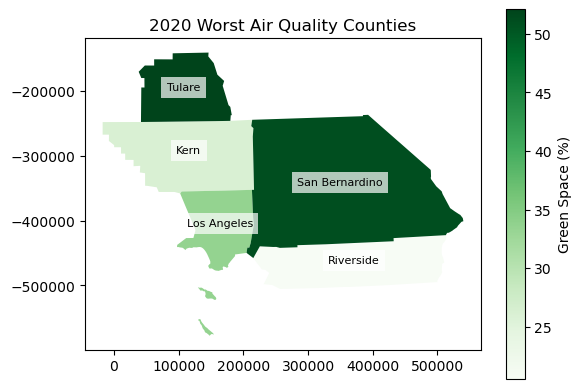

In [42]:
# Plot green space percentages

worst_counties_2020 = ['San Bernardino', 'Riverside', 'Los Angeles', 'Tulare', 'Kern']

CA_county_bndries_worst[CA_county_bndries_worst['NAME'].isin(worst_counties_2020)].plot(column='green_percentage', cmap='Greens', legend=True, 
                 legend_kwds={'label': "Green Space (%)"})
plt.title("2020 Worst Air Quality Counties")

# Add labels
for _, row in CA_county_bndries_worst[CA_county_bndries_worst['NAME'].isin(worst_counties_2020)].iterrows():
    # Get the centroid of each county
    x, y = row['geometry'].centroid.coords[0]
    # Add the county name at the centroid
    plt.text(x, y, row['NAME'], fontsize=8, ha='center', color='black', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))

    
#Save plot
plt.savefig("2020WorstCounties_greenSpacePc.png", dpi=300, bbox_inches="tight", format="png")

plt.show()

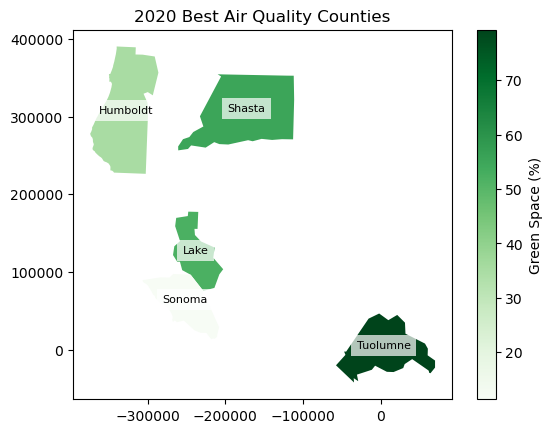

In [43]:
# Plot green space percentages

best_counties_2020 = ['Lake', 'Humboldt', 'Shasta', 'Sonoma', 'Tuolumne']

CA_county_bndries_best[CA_county_bndries_best['NAME'].isin(best_counties_2020)].plot(column='green_percentage', cmap='Greens', legend=True, 
                 legend_kwds={'label': "Green Space (%)"})
plt.title("2020 Best Air Quality Counties")

# Add labels
for _, row in CA_county_bndries_best[CA_county_bndries_best['NAME'].isin(best_counties_2020)].iterrows():
    # Get the centroid of each county
    x, y = row['geometry'].centroid.coords[0]
    # Add the county name at the centroid
    plt.text(x, y, row['NAME'], fontsize=8, ha='center', color='black', bbox=dict(facecolor='white', edgecolor='none', alpha=0.7))

    
#Save plot
plt.savefig("2020BestCounties_greenSpacePc.png", dpi=300, bbox_inches="tight", format="png")

plt.show()

For 2020 worst counties, what are the 2020 number of Total Unhealthy Days?
For 2020 best counties, what are the 2020 number of Total Unhealthy Days?